In [1]:
import pandas as pd

In [2]:
import numpy as np

In [3]:
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

# End To End Multi-Class Dog Breed Classification

This notebook builds an End to Ends multi-class image classifier using TensorFLow 2.0 and TensorFLow Hub

## 1. Problem
Identifying the breed of a dog given an image of a dog.

## 2. Data 
The data we are using is from Kaggle's dog breed identification competition.
https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features:
Some information about the data:
* we are dealing with images (unstructured data) so it is probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* there are 10k + images in traiing set (these images have labels).
* there are 10k+ images in test set(these images do not have labels, because we want to predict them).

## Get our Workspace ready
* Import Tensorflow 2.x 
* Import Tensorflow hub
* Make sure we are using a GPU


In [4]:
# Import necessary tools in loab
import tensorflow as tf
import tensorflow_hub as hub

print("TF Hub Version:", hub.__version__)
print("TF Version:", tf.__version__)

# Check for GPU availability

print("GPU", "avaialble" if tf.config.list_physical_devices("GPU") else "not available")

TF Hub Version: 0.12.0
TF Version: 2.5.0
GPU avaialble


## Getting our data ready and turning into tensors

Since in machine learning model, our data needs to be in a numerical format, we need to convert our images into tensors(numerical format)

Lets start by accessing our data and checking our labels.

In [5]:
# Checkout the labels of our dataa
import pandas as pd
labels_csv=pd.read_csv("drive/My Drive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     51ef1373e9b45f69fecb67bbc1d4406b  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


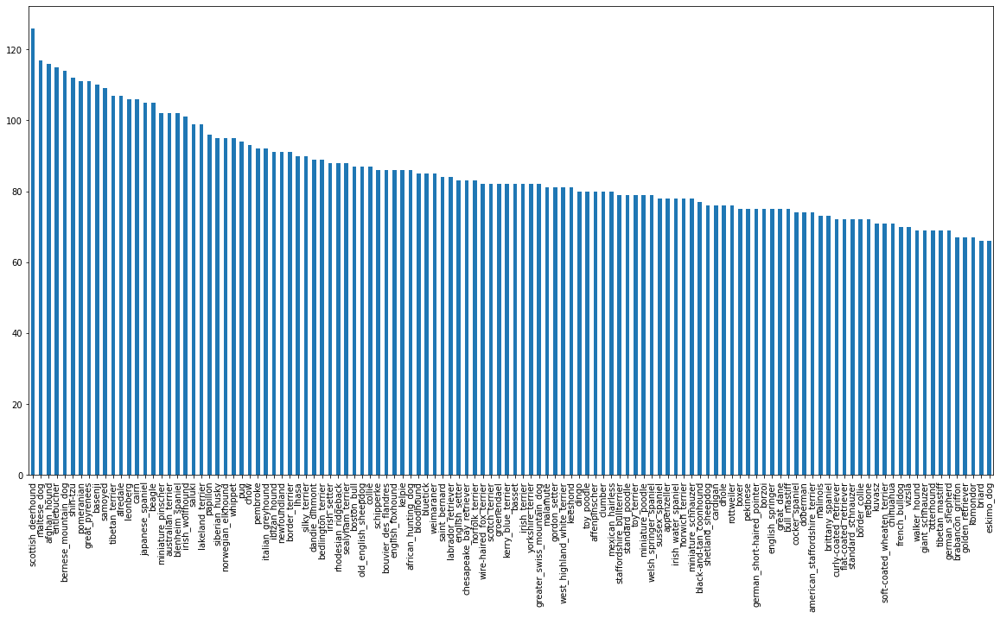

In [6]:
# How many images are there of each breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

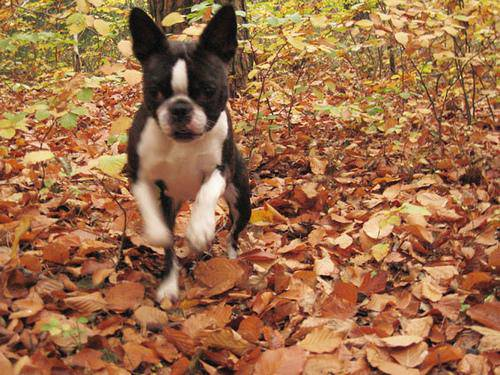

In [7]:
# Let's view an image

from IPython.display import Image
Image("drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")



## Getting Images and labels

Let's get a list of all image pathnames


In [8]:
# Create pathnames from image ids

filenames=["drive/My Drive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]


['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [9]:
# Check wether nummber of filenames matches with actual image files
import os
if len(os.listdir("drive/My Drive/Dog Vision/train")) ==len(filenames):
  print("FIlenames match actual numbers of files. Proceed!")
else:
  print("Filenames are not of same numbers, check the target directory")

FIlenames match actual numbers of files. Proceed!


In [10]:
len(os.listdir("drive/My Drive/Dog Vision/train")), len(filenames)

(10222, 10222)

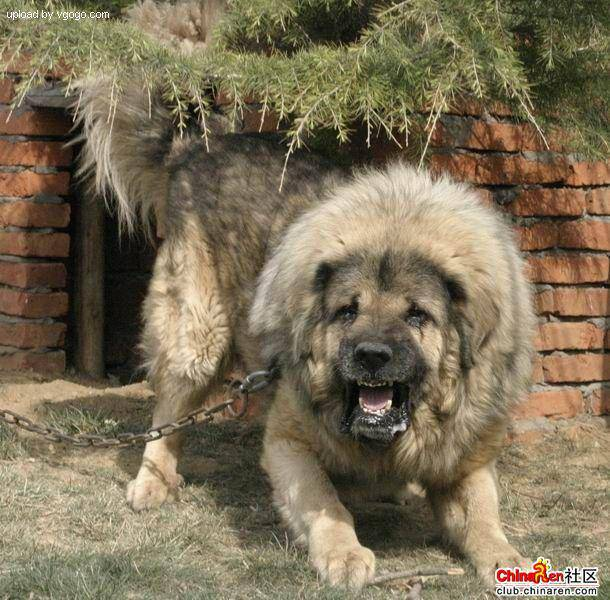

In [11]:
# One more check
Image(filenames[9000])

In [12]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we have now got our training image filepaths in a list, let's prepare our labels

In [13]:
import numpy as np
labels= labels_csv["breed"]
labels= np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [14]:
# See if numbers of labels matches number of filenames

if len(labels)==len(filenames):
  print("Number of labels matches number of filenames")
else:
  print("Number of labels does not matches number of filenames, please check directory")

Number of labels matches number of filenames


In [15]:
#find unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [16]:
# Turn labels into array of booleans
print(labels[0])

boston_bull


In [17]:
labels[0]== unique_breeds

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [18]:
# Turn every label into boolean array

boolean_labels= [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [19]:
len(boolean_labels)

10222

In [20]:
# Example: trurning boolean array into integers

print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print( boolean_labels[0].argmax()) # index where label occurs in boolean aray
print(boolean_labels[0].astype(int)) # there will be 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Creating our own validation set

Since dataset from kaggle does not come with a validation set, so we are going to create our own

In [21]:
# Setup X and y variables
X= filenames
y = boolean_labels


We are going to start off experimenting with 1000 images and increase as needed

In [22]:
# Set number of images to use for parameter

NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:100}

In [23]:
# Lets split data into train and validation sets
from sklearn.model_selection import train_test_split
 # Split train into training and validation sets of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                   y[:NUM_IMAGES],
                                                   test_size=0.2,
                                                   random_state=42)
len(X_train), len(X_val), len(y_train), len(y_val)
 

(800, 200, 800, 200)

## Preprocessing Images (turning images into tensors)

 To preprocess our images into tensors, we are going to write a function which does a few things

 1. Take an image as imput
 2. Use Tensorflow to read the file and save it to a variable 'image'
 3. Turn our 'image' into tensors
 4. Resize the 'image' to be a shape of (224,224)
 5. Return modified image


 Before we do lets see what importing an image looks like






In [24]:
# COnvert an image into numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape


(257, 350, 3)

In [25]:
image.max(), image.min()

(255, 0)

In [26]:
# turn image into tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we have seen an image looks like as a tensor,lets now create a function to preprocess an image

1. Take an image as imput
2. Use Tensorflow to read the file and save it to a variable 'image'
3. Turn our 'image' into tensors
4. Normalize our image, Convert the color channel values from 0-255 to 0-1 values
5. Resize the 'image' to be a shape of (224,224)
6. Return modified image





In [27]:
# Define image size
IMG_SIZE= 224

def process_image(image_path, image_size= IMG_SIZE):
  """
  Takes an image file path and converts the image into tensors
  """

  #Read an image file
  image=tf.io.read_file(image_path)

  #Turn the jpeg image into numerical tensor with 3 color channels
  #(Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)

  #Convert the color channel values from 0-255 to 0-1 values, this is called normalization

  image= tf.image.convert_image_dtype(image, tf.float32)

  #Resize the image to our desired value(224, 224)
  image= tf.image.resize(image, size=[image_size, image_size])

  return image

## Turning Data into Batches



1.   why turn our data into batches?


*   Lets say you are trying to process 10k images in one go, they all might not fit into memory
*   Thats's why we do 32 images at a time. You can manually adjust batch size if needed


2.   In order to use TensorFlow effectively we need our data in form of Tensor tuples which looks like this:
'(image, label)'.







In [28]:
# Create a simple function to return a tuple of tensors

def get_image_label(image_path, label):
  """
  Takes an image file path name and label,
  processed the image and returns a typle of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [29]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))


(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we have got a way to turn our data into tuples of tensors in the form of (image, label), lets make a function which turns all our data (X & y) into batches

In [30]:
#Define batch size

BATCH_SIZE=32

#Create a function to turn data into batches

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of images (X) and label (y) pairs.
  Shuffles the data if it's a training data but does not shuffle if it is validation data.
  Also accepts test data as input(no labels).

  """

  #If the data is a test dataset we probably do not have lables

  if test_data:
    print("Creating test data batches....")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only file paths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # IF data is a valid dataset we do not need to shuffle it

  elif valid_data:
    print("Creating validation data batches...")
    data= tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                              tf.constant(y))) #labels
    data_batch= data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating trainig data batches....")

    #Turn file paths and labels into tensors

    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images

    data = data.shuffle(buffer_size=len(X))

    #Create image label tupples (this also turns image path into a preprocssed image)
    data = data.map(get_image_label)  

    #Turn training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch                                       

In [31]:
# create training and validation 

train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating trainig data batches....
Creating validation data batches...


In [32]:
# Lets check out the diff attribute  of our batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches

Our data is now in batches, however these can be a little hard to understand/comprehand so lets convert them into vaisual images




In [33]:
import matplotlib.pyplot as plt

# Create  a function for viewing images in a data batcj

def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  #Setup the figure
  plt.figure(figsize=(20, 10))
  #Loop through 25 images
  for i in range (25):
    #Create subplots
    ax= plt.subplot(5, 5, i+1)
    #Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    #Turn the gridlines off
    plt.axis("off")


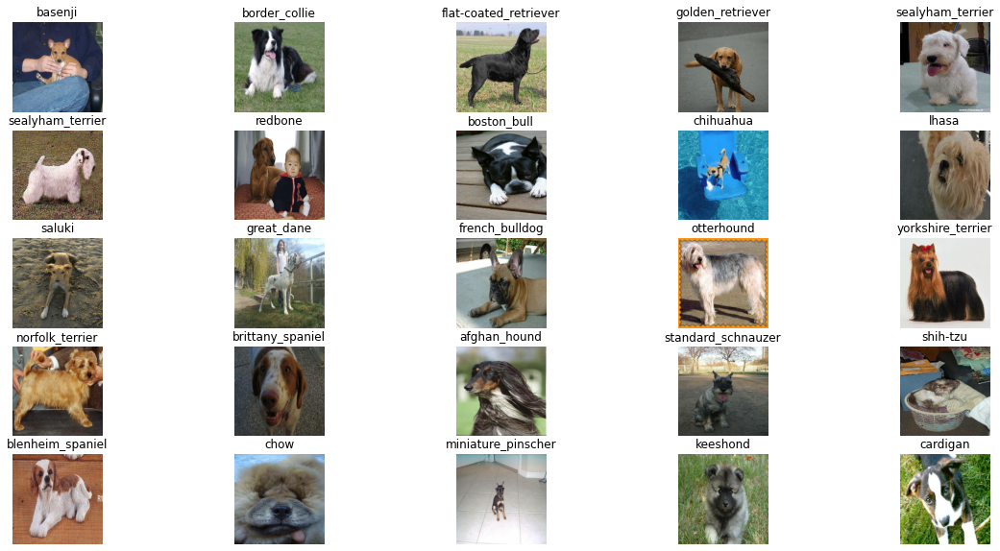

In [34]:
# now lets visualize the data in training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

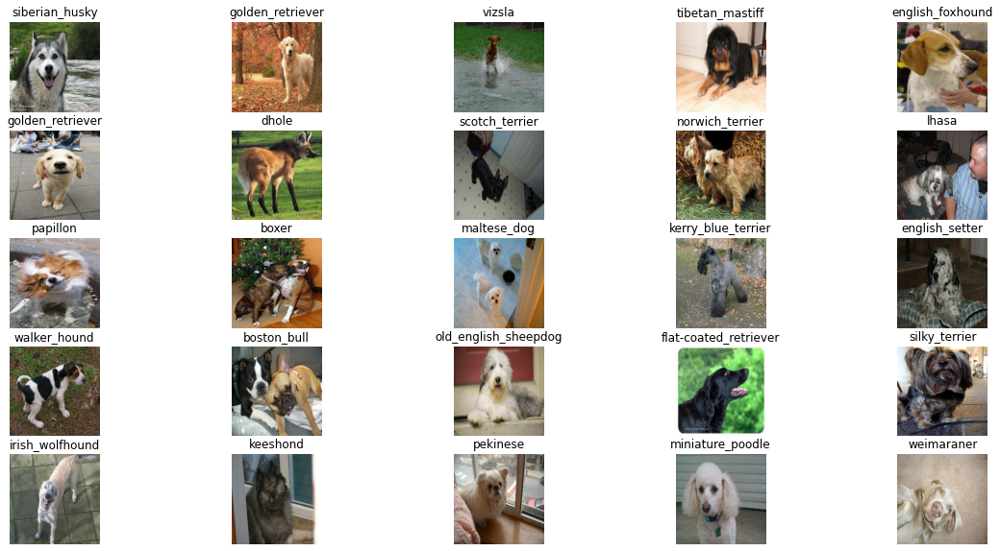

In [35]:
#Lets visualize validation set
val_images, val_labels = next(train_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define.

1. Input shape ( our images shape, in form of Tensors) to our models
2. The output shape ( image labels, in the form of tensors) of our model
3. The URL of the model we want to use.
URL: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [36]:
# Setup the input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

#Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

#Setup model URL from Tensorflow Hub

MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we have got our inputs outputs and model ready to go, lets put them together into a keras deep learning model!

Knowing this, let's create a function which:
* Takes the input, output shape and the model we have chosen as parameters.
* Defines the layers in a keras model in sequential manner.
* Compiles the model 
* Builds the model (tells the model the input shape it will be getting)
* Returns the model

All of the steps can be fond at keras overview page of tensorflow


In [37]:
# Create a function which builds a keras model

def create_model(input_shape= INPUT_SHAPE, output_shape= OUTPUT_SHAPE, model_url= MODEL_URL):
  print("Building model with:", MODEL_URL)

  #setup the model layers
  model = tf.keras.Sequential([
                               
                               hub.KerasLayer(MODEL_URL), #Layer 1 (input)
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                                     activation="softmax") #Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer= tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  #Build the model
  model.build(INPUT_SHAPE)

  return model

In [38]:
model= create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


# Creating a callback

callbacks are helpeer functions a model can use during training to do such things as save progress, save its progress or stop early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our model progress and other one is early stoppping which prevents our model from training too long


TensorBoard Callback
We need to do 3 things
* Load  the tensorboard notebook extensions
* Create a Tensorboard cllback which is abke to save logs to a directtory and pass it to our model's fit() function
* Visualize our model training logs with the %tensorboard magic function (do this after model training)

In [39]:
%load_ext tensorboard

In [40]:
import datetime
#Create a function to build TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir= os.path.join("drive/My Drive/Dog Vision/logs",
                       #Make it so that the logs gets tracked whenever we run an experiment


                       datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early stopping callback

early stopping helps stop our model from oveerfiting by stopping to fit if a certain evaluation metric stops improving

In [41]:
early_stopping= tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                 patience=3)

## Training a model (on subset of data)

Our first model is working on only 1000 images to make sure everything is working fine.


In [42]:
NUM_EPOCHS= 100 #@param {type:"slider", min:10, max:100, step:10}

In [43]:
# check to make sure we are still running on a GPU
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


Lets create a function which trains a model
* Create a model using 'create_model()'
* Setup a TensorBoard callbak using 'create_tensorboard_callback()'
* call the 'fit()' function on our model passing it the taining data, validation data, number of epochs to train for and the callbacks
* return the model




In [44]:
#Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version
  """
  #Create a model
  model= create_model()

  #Create a new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  #Fit the model to the data ppassing it the callbacks we created
  model.fit(x= train_data,
            epochs=NUM_EPOCHS,
            validation_data= val_data,
            validation_freq= 1,
            callbacks=[tensorboard, early_stopping])
  #Return the fitted model
  return model

In [45]:
#Fit the model to data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 117s 3s/step - loss: 4.4528 - accuracy: 0.1100 - val_loss: 3.4281 - val_accuracy: 0.2000
Epoch 2/100
25/25 [==============================] - 3s 113ms/step - loss: 1.5775 - accuracy: 0.7025 - val_loss: 2.2157 - val_accuracy: 0.4500
Epoch 3/100
25/25 [==============================] - 3s 113ms/step - loss: 0.5497 - accuracy: 0.9262 - val_loss: 1.7434 - val_accuracy: 0.5400
Epoch 4/100
25/25 [==============================] - 3s 114ms/step - loss: 0.2469 - accuracy: 0.9887 - val_loss: 1.5699 - val_accuracy: 0.5800
Epoch 5/100
25/25 [==============================] - 3s 115ms/step - loss: 0.1409 - accuracy: 0.9987 - val_loss: 1.4804 - val_accuracy: 0.6050
Epoch 6/100
25/25 [==============================] - 3s 114ms/step - loss: 0.0972 - accuracy: 1.0000 - val_loss: 1.4292 - val_accuracy: 0.6200
Epoch 7/100
25/25 [==============================]

### CHecking the tensorBoard logs

The tensorBoard magic function ('%tensorboard') will access the logs directory and visualize its contents

In [46]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [47]:
# Make predictions on the validation data (not used to train on)

predictions= model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 97ms/step


array([[2.7884496e-04, 7.1740455e-05, 8.8219595e-04, ..., 5.0021644e-04,
        4.1475429e-05, 7.3646498e-04],
       [9.2924060e-04, 1.1224441e-03, 5.7738207e-02, ..., 7.8845688e-04,
        1.1081117e-02, 1.4828455e-04],
       [3.5253834e-05, 4.0659224e-04, 4.0055056e-05, ..., 7.3021583e-05,
        3.8866110e-05, 7.4894930e-04],
       ...,
       [4.3084577e-07, 5.4131004e-05, 1.8310300e-05, ..., 1.3753656e-06,
        3.6647834e-05, 3.8101045e-06],
       [4.9114353e-03, 5.6034588e-04, 3.2437340e-05, ..., 8.9965899e-05,
        2.4978293e-05, 1.4082847e-02],
       [1.3169619e-04, 2.1714735e-05, 4.1025571e-04, ..., 1.8615610e-03,
        1.4897424e-04, 4.8568272e-05]], dtype=float32)

In [48]:
predictions.shape

(200, 120)

In [49]:
len(y_val)

200

In [50]:
len(unique_breeds)

120

In [51]:
np.sum(predictions[1])

1.0

## We are using our componenets because we have used softmax, it gives length 120 of array and the sum of all elements is close or equal to 1

In [52]:
# FIrst prediction
index=42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum:{np.sum(predictions[index])} ")
print(f"Max index:{np.argmax(predictions[index])}")
print(f"Predicted label:{unique_breeds[np.argmax(predictions[index])]}")

[1.90274979e-04 6.65346161e-05 1.09962402e-05 3.00475331e-05
 2.24496773e-03 5.40979854e-05 1.05826133e-04 8.74228368e-04
 1.46262730e-02 3.27189267e-02 2.02391129e-05 1.86220786e-05
 2.46151118e-04 4.94402740e-03 3.81900230e-04 3.21504544e-03
 2.48930373e-05 1.01063587e-03 7.39515119e-04 1.66231897e-04
 2.06929035e-05 6.24433742e-04 6.62820457e-05 1.83800403e-05
 1.10361092e-02 4.47454622e-05 3.07094670e-05 2.09488091e-04
 2.87649600e-04 4.30033106e-05 9.44732674e-05 6.04813977e-05
 1.25611143e-04 4.51274245e-05 3.04714158e-05 1.25863909e-04
 7.16130948e-04 4.09711938e-04 4.71823587e-05 4.46795464e-01
 1.14096903e-04 1.06094276e-05 8.20668042e-03 3.51842427e-05
 3.78924451e-04 2.63144884e-05 6.69637884e-05 8.90530762e-04
 1.95566463e-05 1.09921573e-04 5.93893528e-05 2.47188669e-04
 1.11414364e-03 3.31815565e-03 6.84184852e-05 5.27247263e-04
 2.12682455e-04 6.15056633e-05 7.69445687e-05 2.10796334e-05
 8.43935195e-05 2.03642630e-04 4.96716166e-05 5.92205870e-05
 1.05098967e-04 1.466249

## It would be better if we could see the image the prediction is being made on

**NOTE**  - Prediction probabbility are also known as confidence levels

In [53]:
# Turn probabilities into their respective label

def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction pprobabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities

pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

Since our validation data is still in a batch dataset, we'll have to unbatchify if to make predictions on the validation images and then compare it to our prediction

In [54]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [55]:
#Create a function to unbatch the dataset

def unbatchify(data):
  """
  Takes a batched dataset of (images, label) Tensors and returns separate arrays
  of image and labels

  """
  images= []
  labels= []

  #Loop through unbatches data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

  # Unbatchify the validation data
val_images, val_labels=unbatchify(val_data) 
val_images[0], val_labels[0]



(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [56]:
get_pred_label(val_labels[0])


'affenpinscher'

Now we have got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Lets make some function to make all a bit more visual.

We'll create a function which

* takes an array of predictions probabilities, an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.




In [57]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  #Get the pred label
  pred_label= get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #CHange the color of the title depending on if the prediction is right or wrong:

  if pred_label== true_label:
    color="green"
  else:
    color="red"

  # CHange the plot title to be predicted,probability of prediction and truth label

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

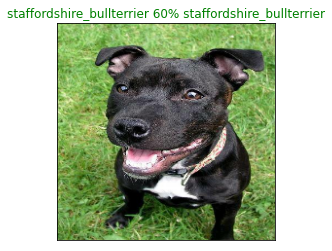

In [58]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images= val_images,
          n=50
          )

Now we have got one function to visualize our model's top predictions. Let's make another to view our model's to 10 predictions.

This function will:
* Take an input of prediction probabilites array and a ground truth array and an integer
* Find the prediction using 'get_pred_label()'
* Find the top 10:
  * Prediction probabilities indexes
  * prediction probabilities values
  * Prediction Labels
* Plot the top 10 prediction probability values an labels, coloring the true label in green

In [59]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest predcitions confidences along with truth label for sample n.
  """

  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  #Find the top 10 predictions

  top_10_pred_indexes= pred_prob.argsort()[-10:][::-1]
  # find top_10 predction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels= unique_breeds[top_10_pred_indexes
  ]


  # Setup a plot

  top_plot= plt.bar(np.arange(len(top_10_pred_labels)),
                    top_10_pred_values,
                    color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels= top_10_pred_labels,
             rotation="vertical")
  
  #Change the color of true labels
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels== true_label)].set_color("green")
  else:
    pass

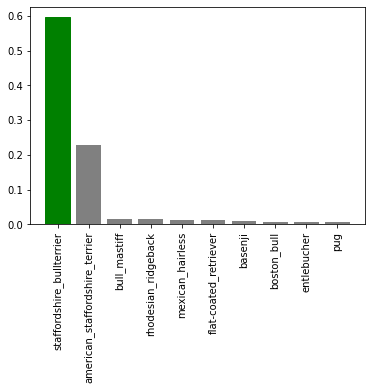

In [60]:
plot_pred_conf(prediction_probabilities=predictions, labels= val_labels, n=50 )


Let's combine the images and graphs 

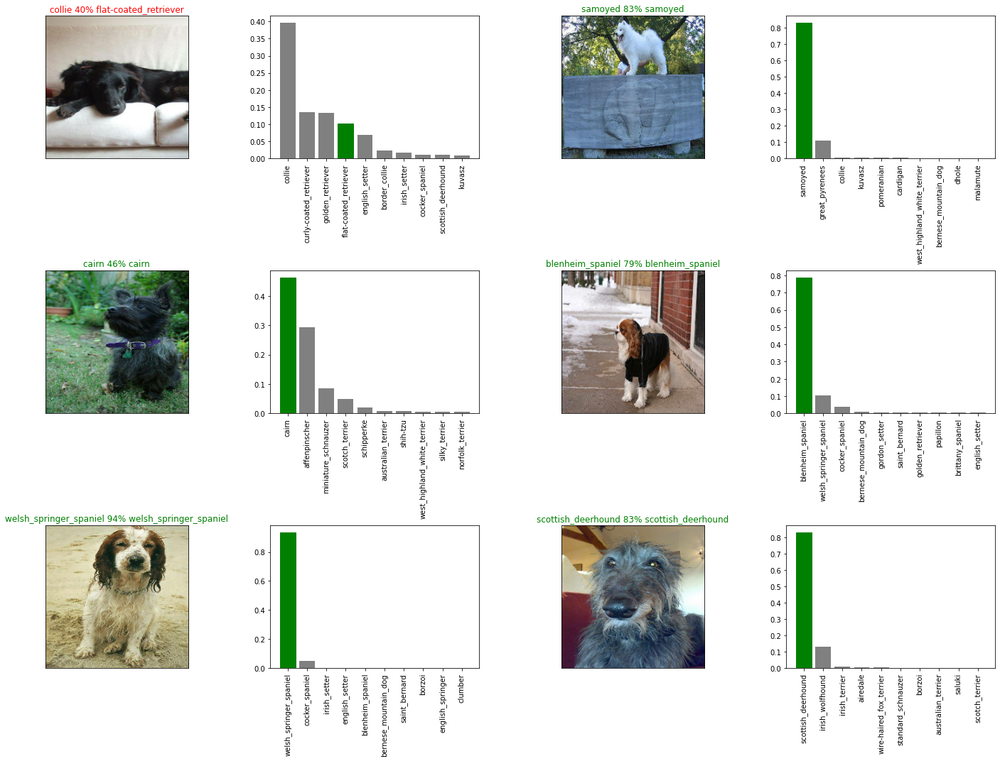

In [61]:
# Lets check out a few predictions and their diff values:
i_multiplier = 20
num_rows= 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities= predictions,
          labels= val_labels,
           images=val_images,
           n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels= val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)  
plt.show()

## Saving and reloading a model


In [62]:
#Create a function to save a model

def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string)
  """
  #Create a model directory pathname with current time
  modeldir= os.path.join("drive/My Drive/Dog Vision/models",
                         datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path= modeldir + "-" + suffix + ".h5" #save format of a model
  print(f"save model to :{model_path}...")
  model.save(model_path)
  return model_path

In [67]:
#Create a function to load a model
def load_model(model_path):
  """
  loads a saved model from a specified path
  """
  print(f"Loading a model from path: {model_path}")
  model= tf.keras.models.load_model(model_path,
                                    custom_objects={"KerasLayer": hub.KerasLayer})
  return model

In [68]:
## Now we have got functions to save and load a model, let's make sure they work

#Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

save model to :drive/My Drive/Dog Vision/models/20210605-10581622890708-1000-images-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20210605-10581622890708-1000-images-mobilenetv2-Adam.h5'

In [70]:
#Load a trained model
loaded_1000_image_model= load_model('drive/My Drive/Dog Vision/models/20210605-10581622890708-1000-images-mobilenetv2-Adam.h5')

Loading a model from path: drive/My Drive/Dog Vision/models/20210605-10581622890708-1000-images-mobilenetv2-Adam.h5


In [71]:
#Evaluate a pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 79ms/step - loss: 1.2827 - accuracy: 0.6550


[1.2826844453811646, 0.6549999713897705]

In [72]:
#Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 73ms/step - loss: 1.2827 - accuracy: 0.6550


[1.2826844453811646, 0.6549999713897705]

## Training a big dog model on full dataset (10000+ images)

In [74]:
len(X), len(y), len(X_train), len(y_train)

(10222, 10222, 800, 800)

In [75]:
# Create a data batch with the full dataset
full_data= create_data_batches(X,y)

Creating trainig data batches....


In [76]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [77]:
len(full_data)

320

In [78]:
#Create a model for full model
full_model= create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [79]:
# Create full model callbacks
full_model_tensorboard= create_tensorboard_callback()
# No validation set wen training on all the data, so we can't monitor validation accuracy
full_model_early_stopping= tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                            patience=3)

## Runnning the cell below will take a little while
(maybe upto 30 mins for the first epoch) because the GPU we are using in the runtime has to call all images into memory

In [81]:
#Fit the full model to full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 989s 3s/step - loss: 1.3573 - accuracy: 0.6644
Epoch 2/100
320/320 [==============================] - 29s 90ms/step - loss: 0.3988 - accuracy: 0.8838
Epoch 3/100
320/320 [==============================] - 29s 89ms/step - loss: 0.2361 - accuracy: 0.9341
Epoch 4/100
320/320 [==============================] - 29s 90ms/step - loss: 0.1522 - accuracy: 0.9661
Epoch 5/100
320/320 [==============================] - 29s 90ms/step - loss: 0.1065 - accuracy: 0.9794
Epoch 6/100
320/320 [==============================] - 29s 90ms/step - loss: 0.0775 - accuracy: 0.9868
Epoch 7/100
320/320 [==============================] - 29s 90ms/step - loss: 0.0577 - accuracy: 0.9920
Epoch 8/100
320/320 [==============================] - 29s 90ms/step - loss: 0.0461 - accuracy: 0.9940
Epoch 9/100
320/320 [==============================] - 28s 89ms/step - loss: 0.0371 - accuracy: 0.9962
Epoch 10/100
320/320 [==============================] - 29s 89ms/step - lo

In [82]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

save model to :drive/My Drive/Dog Vision/models/20210605-12001622894435-full-image-set-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20210605-12001622894435-full-image-set-mobilenetv2-Adam.h5'

Load in the full model

In [83]:
loaded_full_model= load_model('drive/My Drive/Dog Vision/models/20210605-12001622894435-full-image-set-mobilenetv2-Adam.h5')

Loading a model from path: drive/My Drive/Dog Vision/models/20210605-12001622894435-full-image-set-mobilenetv2-Adam.h5


## Making predictions on a test dataset
Since our model is trained on images of the form batches. to make a prediction on test data, we need to have them into the right shape and format.
We created creat_data_batches() earlier which cantake a list of filenmes as input and convert them into Tensor batches

To make the predictions we will:
* Get the test image filenames
* Convert the filenames into test data batches using create_data_batches() and setting the ''test_data' parameter to 'True' (since the test data does not have labels)
* Make a predictions array by passing the test batches to the predict() method called

In [84]:
#Load test image filenames
test_path = "drive/My Drive/Dog Vision/test/"
test_filenames= [test_path +fname for fname in os.listdir(test_path) ]
test_filenames[:10]

['drive/My Drive/Dog Vision/test/e09f4ff3f7acee994812650a2fc7edef.jpg',
 'drive/My Drive/Dog Vision/test/dd1eddb779b2611cdd42de48ae623a62.jpg',
 'drive/My Drive/Dog Vision/test/dd703c7beeaf5cba5533d5f42b608f2e.jpg',
 'drive/My Drive/Dog Vision/test/e2e9e37fa587ad87761da12e105c2b6b.jpg',
 'drive/My Drive/Dog Vision/test/e119301e11d4f1620948c3e6f5a3f021.jpg',
 'drive/My Drive/Dog Vision/test/ddd7f84a932ec7213b9c1f6de8c09262.jpg',
 'drive/My Drive/Dog Vision/test/e334f758c7944df19c98d49498d28c64.jpg',
 'drive/My Drive/Dog Vision/test/e440ec011c3c7ea94838ab5fc466159c.jpg',
 'drive/My Drive/Dog Vision/test/e73efb021b7b49e328b2159d34060b82.jpg',
 'drive/My Drive/Dog Vision/test/e09859cae41cb59228518c09c3b27362.jpg']

In [85]:
#Create test databatch

test_data =  create_data_batches(test_filenames, test_data=True)

Creating test data batches....


In [87]:
test_data, len(test_data)

(<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>, 324)

**Note:** Calling predict on our full model and passing it the test data batch will take a long time (about 1 hour)

In [88]:
#Make predictions on test data batch using the loaded full model
test_predictions= loaded_full_model.predict(test_data,
                                            verbose=1)

324/324 [==============================] - 1190s 4s/step


In [89]:
# Save predictions (Numpy Array) to csv file (for access later)
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")


In [90]:
# Load Predictions (Numpy Aray) from csv file
test_predictions= np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv", delimiter=",")

In [91]:
test_predictions[:10]

array([[5.97939254e-10, 2.69829686e-10, 4.06560297e-09, ...,
        1.56010416e-09, 1.40764400e-10, 1.67516545e-09],
       [6.67248765e-12, 8.15520408e-14, 1.08974549e-13, ...,
        2.13249735e-15, 7.76204933e-14, 1.15635123e-11],
       [2.55478250e-10, 3.45763510e-07, 3.00120195e-09, ...,
        5.90617066e-09, 5.44996123e-13, 7.71929812e-11],
       ...,
       [1.18987145e-06, 9.40831324e-09, 1.32773043e-10, ...,
        2.08173340e-10, 1.10148072e-07, 1.04687922e-06],
       [3.29166028e-09, 4.45112995e-08, 1.37839873e-08, ...,
        2.09808627e-06, 1.09006570e-09, 2.03049133e-09],
       [3.42882905e-12, 3.88594684e-10, 1.05075981e-09, ...,
        1.15214904e-09, 1.87465545e-08, 8.24352864e-10]])

## Preparing test dataset predictions for kaggle.


In [92]:
#Create apandas dataframe
preds_df= pd.DataFrame(columns=["id"] + list(unique_breeds))
#preds_df.head()


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [95]:
# Append test image ids to predictions Dataframe
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"]= test_ids

In [96]:
# Add the prediction probabilities to each dog breed column

preds_df[list(unique_breeds)]= test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e09f4ff3f7acee994812650a2fc7edef,5.97939e-10,2.6983e-10,4.0656e-09,2.26689e-05,2.70368e-09,2.12267e-10,1.7587e-11,9.2542e-12,1.75028e-11,3.21869e-10,7.65425e-12,7.86764e-10,4.81735e-09,5.21545e-12,3.78731e-07,2.89927e-09,3.16782e-10,1.35206e-06,1.54204e-11,3.974e-09,9.63105e-09,7.73189e-09,4.57789e-07,6.80197e-08,5.2653e-11,3.36817e-07,2.29588e-07,1.45979e-09,4.41373e-09,2.3959e-07,8.50946e-13,1.40495e-10,1.40999e-09,3.59217e-10,5.70099e-11,1.54383e-13,6.7955e-10,3.71551e-07,1.04838e-08,...,1.13528e-05,5.53681e-09,4.6505e-11,2.62457e-13,1.52129e-09,1.81395e-10,2.58759e-11,3.67495e-11,1.1783e-07,9.83955e-10,1.57574e-09,1.37139e-10,2.82149e-11,4.52149e-10,6.33724e-10,1.2045e-07,7.11109e-10,6.01078e-13,2.51305e-12,2.79667e-10,2.38456e-11,8.60589e-10,3.7751e-09,2.05596e-09,1.61805e-07,1.33617e-09,5.45959e-11,2.07974e-10,9.45911e-12,3.6621e-09,2.04449e-11,7.15867e-08,7.53486e-09,7.31787e-10,3.1219e-10,2.23382e-14,3.32258e-12,1.5601e-09,1.40764e-10,1.67517e-09
1,dd1eddb779b2611cdd42de48ae623a62,6.67249e-12,8.1552e-14,1.08975e-13,8.14748e-16,1.28464e-12,1.34427e-14,7.30631e-10,2.23389e-12,5.33162e-17,2.12917e-14,1.06964e-16,3.77391e-12,1.42461e-12,1.45331e-14,6.25457e-15,1.88036e-14,4.62838e-15,2.40322e-16,2.71136e-16,1.96382e-16,1.69479e-14,2.82529e-15,3.17007e-13,2.19573e-14,1.89616e-14,4.31557e-14,1.11074e-12,8.09559e-15,7.36445e-14,3.70742e-10,7.89187e-09,4.63724e-15,9.65927e-14,2.44328e-10,3.54938e-17,5.33496e-16,6.07523e-11,1.99171e-15,1.71819e-13,...,1.29128e-15,1.29151e-09,2.04672e-16,2.24537e-14,2.39571e-09,5.265e-13,6.12937e-11,1,3.59626e-15,2.47847e-14,1.44309e-14,2.57792e-13,1.59249e-15,8.82404e-14,1.03062e-10,5.65402e-09,4.76833e-15,3.67897e-14,2.17432e-16,2.73429e-11,3.56492e-15,7.09255e-12,9.27585e-13,5.71342e-15,1.25231e-11,5.16071e-15,3.21883e-16,2.79593e-12,7.5059e-15,3.68979e-12,3.8966e-10,6.21828e-13,9.63763e-14,9.38112e-14,1.48092e-13,7.32484e-16,4.16213e-14,2.1325e-15,7.76205e-14,1.15635e-11
2,dd703c7beeaf5cba5533d5f42b608f2e,2.55478e-10,3.45764e-07,3.0012e-09,4.80817e-09,2.17341e-08,3.82336e-10,1.69146e-12,6.96534e-11,3.70915e-10,4.32143e-11,2.29641e-11,2.75141e-09,4.72237e-10,7.38383e-10,2.48003e-07,1.42306e-10,3.01181e-10,2.07875e-08,1.9253e-09,6.9729e-11,3.52376e-07,3.52461e-09,2.69779e-08,1.10714e-05,3.83765e-11,2.20104e-06,3.97275e-08,3.77381e-09,1.98162e-08,2.58328e-10,1.58557e-09,5.56459e-08,2.46933e-09,2.76756e-09,6.67101e-12,3.81073e-10,1.27599e-09,1.51046e-10,2.82354e-09,...,1.09203e-08,2.40212e-10,4.59433e-10,2.29414e-08,8.65545e-10,1.42776e-07,9.49745e-12,4.63719e-09,1.11249e-08,2.86163e-10,7.41345e-10,3.16579e-08,5.69311e-09,1.69225e-07,4.61192e-09,1.51008e-08,9.32211e-11,4.78368e-08,3.98047e-10,2.3755e-07,5.12651e-09,2.40583e-09,1.14894e-09,6.84688e-10,1.28219e-09,2.41453e-09,4.59039e-10,3.76487e-08,8.77624e-08,7.08998e-08,9.1926e-13,7.64088e-12,1.98919e-11,1.2231e-10,2.17307e-11,2.29847e-12,5.3353e-13,5.906

In [97]:
# Puttting our results in csv to submit to kaggle
#preds_df.to_csv("drive/My Drive/Dog Vision/full-model-predictions-submission-1-mobilenetV2.csv", index=False)

## Making predictions to custom images

TO make predictions on custom images:
* Get the file paths of our own images
* Turn the filepaths into data batches using 'creaate_data_batches()'. And since our custom imageswill not have labels
we set the test_data parameter to True
* Pass the custom image data batch to our mdoel's predict() method.
* convert the predictions output probabilities to predictions labels.
* compare the predicted labels to custom images

In [117]:
# Get custom image filepaths
custom_path= "drive/My Drive/Dog Vision/custom-dog-images/"
custom_image_paths= [custom_path + fname for fname in os.listdir(custom_path)]

In [118]:
custom_image_paths

['drive/My Drive/Dog Vision/custom-dog-images/IMG-20210605-WA0008.jpg',
 'drive/My Drive/Dog Vision/custom-dog-images/IMG-20210605-WA0009.jpg',
 'drive/My Drive/Dog Vision/custom-dog-images/IMG-20210605-WA0006.jpg',
 'drive/My Drive/Dog Vision/custom-dog-images/IMG-20210605-WA0007.jpg',
 'drive/My Drive/Dog Vision/custom-dog-images/IMG-20210605-WA0011.jpg',
 'drive/My Drive/Dog Vision/custom-dog-images/IMG-20210605-WA0010.jpg']

In [119]:
# Turn custom images into batch dataset
custom_data= create_data_batches(custom_image_paths, test_data=True)

custom_data

Creating test data batches....


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [120]:
# Make predictions on our custom data
custom_preds= loaded_full_model.predict(custom_data)
custom_preds.shape

(6, 120)

In [121]:
# Get custom image predictions labels
custom_pred_labels=[get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['saint_bernard',
 'saint_bernard',
 'saint_bernard',
 'saint_bernard',
 'black-and-tan_coonhound',
 'miniature_pinscher']

In [122]:
# Get custom images (unbatchify wont work as we do not hav any labels)
custom_images=[]
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

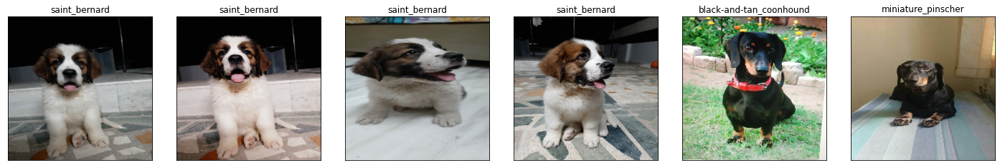

In [130]:
# Check custom image predictions
result_path= "drive/My Drive/Dog Vision/custom-images-results/"
image_name= os.path.join(result_path,
                       #Make it so that the logs gets tracked whenever we run an experiment


                       datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
plt.figure(figsize=(20,15))
for i, image in enumerate(custom_images):
  plt.subplot(1,len(custom_image_paths), i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.tight_layout(pad=3)
  plt.imshow(image)
  plt.savefig(image_name)